In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import unicodedata
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
plt.style.use('fivethirtyeight')



In [2]:
df=pd.read_csv("train_stations_europe.csv")
df.head()

,id,name,name_norm,uic,latitude,longitude,parent_station_id,country,time_zone,is_city,is_main_station,is_airport
0,1,Château-Arnoux—St-Auban,Chateau-Arnoux-St-Auban,NaN,44.081790,6.001625,NaN,FR,Europe/Paris,True,False,False
1,2,Château-Arnoux—St-Auban,Chateau-Arnoux-St-Auban,8775123.0,44.061565,5.997373,1.0,FR,Europe/Paris,False,True,False
2,3,Château-Arnoux Mairie,Chateau-Arnoux Mairie,8775122.0,44.063863,6.011248,1.0,FR,Europe/Paris,False,False,False
3,4,Digne-les-Bains,Digne-les-Bains,9921024.0,44.350000,6.350000,NaN,FR,Europe/Paris,True,False,False
4,6,Digne-les-Bains,Digne-les-Bains,8775149.0,44.088710,6.222982,4.0,FR,Europe/Paris,False,True,False


In [3]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'column': df.columns,
                                 'percent': percent_missing})
missing_value_df.sort_values('percent', inplace=True)
missing_value_df.reset_index(drop=True, inplace=True)
missing_value_df = missing_value_df[missing_value_df['percent']>0]

# Plotting
fig = px.bar(
    missing_value_df, 
    x='percent', 
    y="column", 
    orientation='h', 
    title='Columns with Missing Values', 
    height=200, 
    width=600
)
fig.show()

C:\Users\Giacomo\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



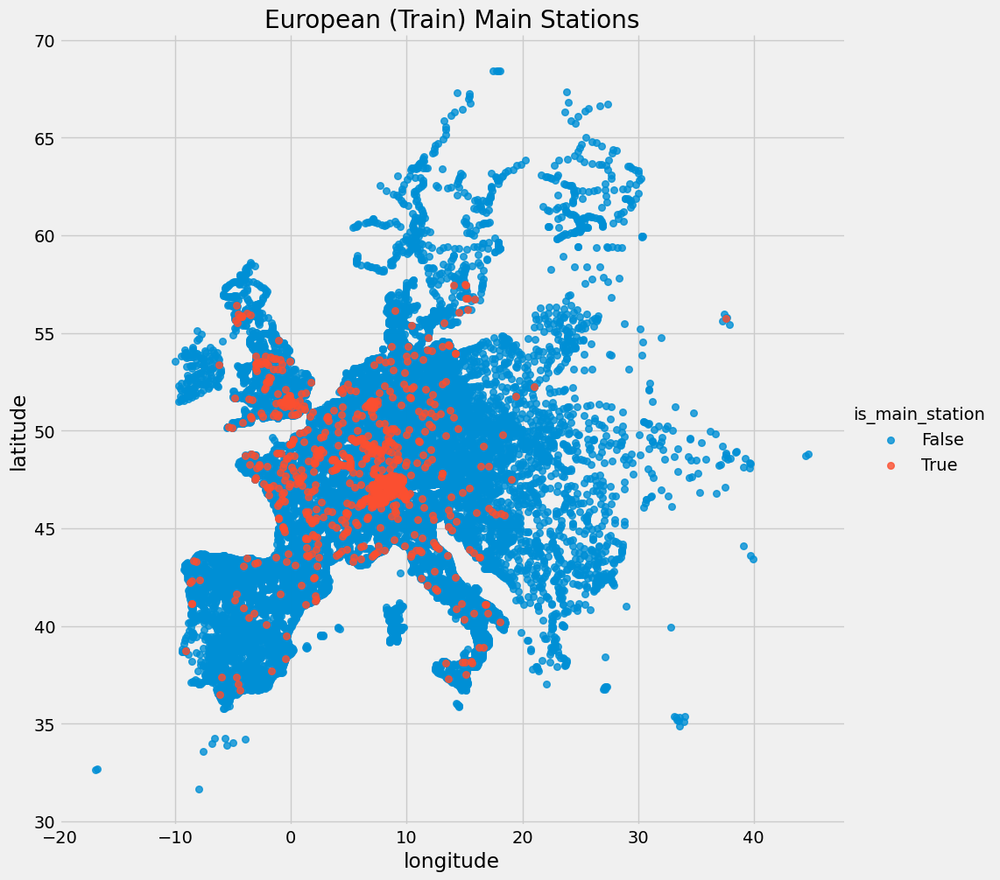

In [4]:
g = sns.lmplot(x="longitude", y="latitude", data=df,
           fit_reg=False, scatter_kws={"s": 30}, hue='is_main_station', height=10)
plt.title('European (Train) Main Stations')
plt.show()

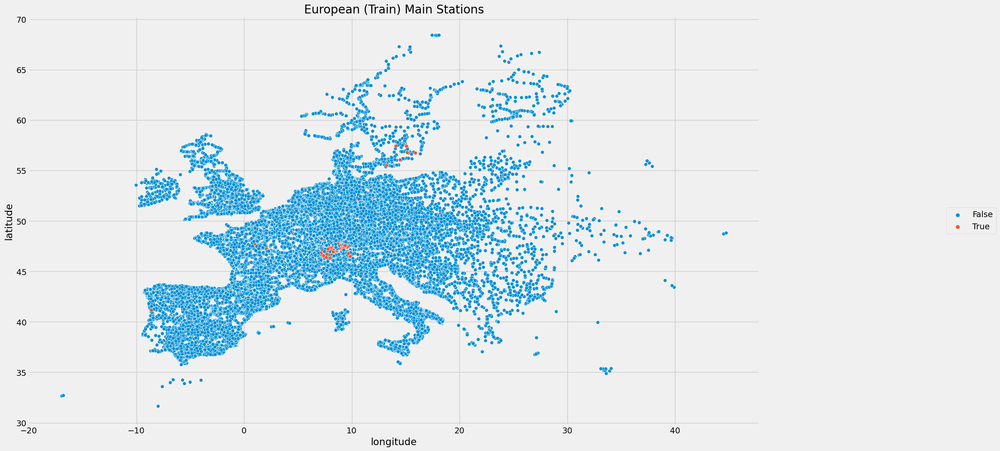

In [5]:
plt.figure(figsize=(20,12))
g = sns.scatterplot(x='longitude', y='latitude', data=df, hue='is_main_station')
plt.title('European (Train) Main Stations')
g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1);

C:\Users\Giacomo\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



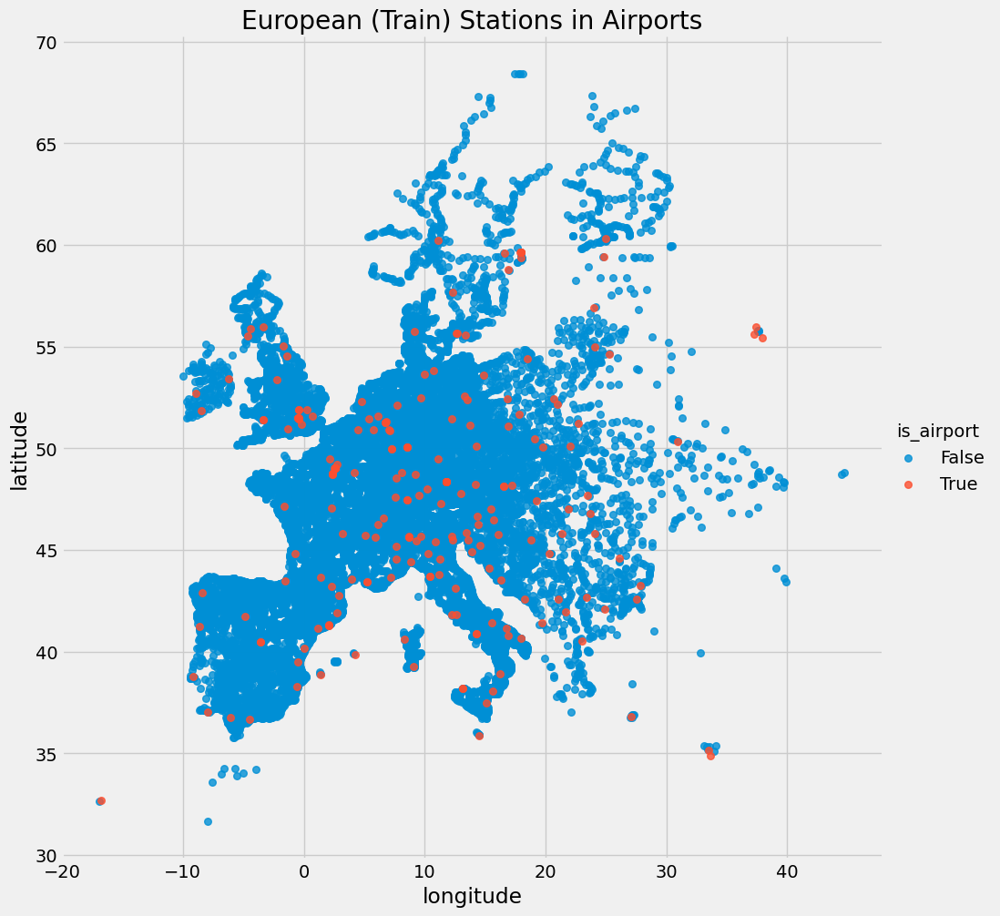

In [6]:
g = sns.lmplot(x="longitude", y="latitude", data=df,
           fit_reg=False, scatter_kws={"s": 30}, hue='is_airport', height=10)
plt.title('European (Train) Stations in Airports')
plt.show()

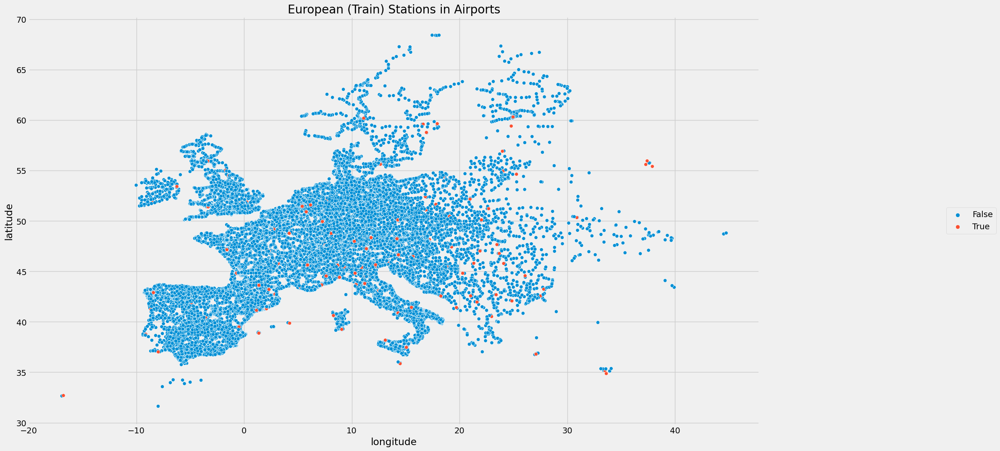

In [7]:
plt.figure(figsize=(20,12))
g = sns.scatterplot(x='longitude', y='latitude', data=df, hue='is_airport')
plt.title('European (Train) Stations in Airports')
g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1);

C:\Users\Giacomo\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



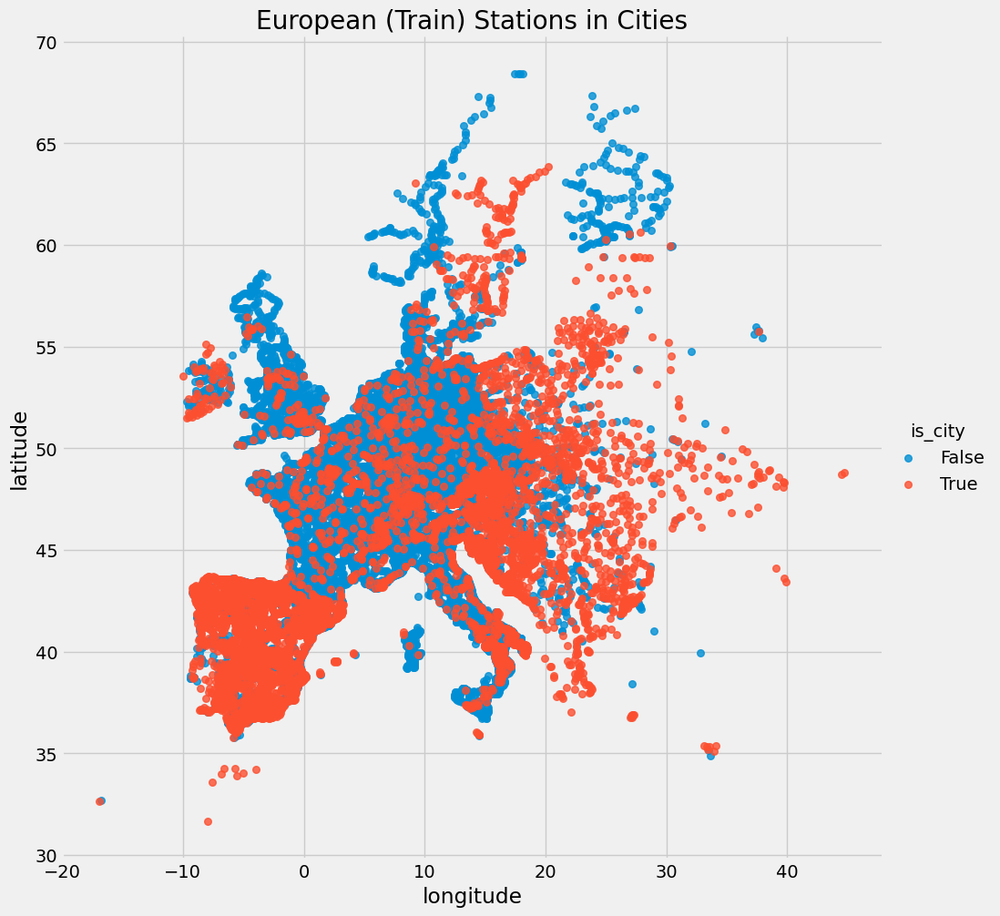

In [8]:
g = sns.lmplot(x="longitude", y="latitude", data=df,
           fit_reg=False, scatter_kws={"s": 30}, hue='is_city', height=10)
plt.title('European (Train) Stations in Cities')
plt.show()

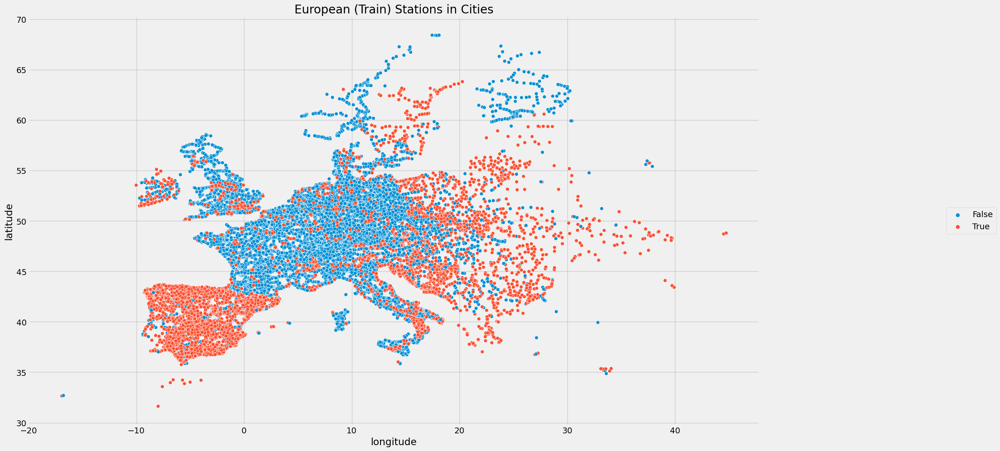

In [9]:
plt.figure(figsize=(20,12))
g = sns.scatterplot(x='longitude', y='latitude', data=df, hue='is_city')
plt.title('European (Train) Stations in Cities')
g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1);

In [10]:
pillgram = df[(df['name']=='Pillgram Schulstraße')].reset_index(drop=True)
pillgram.tail()

,id,name,name_norm,uic,latitude,longitude,parent_station_id,country,time_zone,is_city,is_main_station,is_airport
0,39221,Pillgram Schulstraße,Pillgram Schulstrasse,NaN,52.330505,14.394534,NaN,DE,Europe/Berlin,False,False,False


In [11]:
fig_px = px.scatter_mapbox(pillgram, lat="latitude", lon="longitude",
                           hover_name="name_norm",
                           zoom=11, height=300)
fig_px.update_layout(mapbox_style="open-street-map",
                     margin={"r":0,"t":0,"l":0,"b":0})


fig_px.show()

In [12]:
nimes = df[(df['name']=='Nîmes Pont du Gard')].reset_index(drop=True)
nimes.tail()

,id,name,name_norm,uic,latitude,longitude,parent_station_id,country,time_zone,is_city,is_main_station,is_airport
0,38108,Nîmes Pont du Gard,Nimes Pont du Gard,8770397.0,43.816944,4.507778,22600.0,FR,Europe/Paris,False,False,False


In [13]:
fig_px = px.scatter_mapbox(nimes, lat="latitude", lon="longitude",
                           hover_name="name_norm",
                           zoom=11, height=300)
fig_px.update_layout(mapbox_style="open-street-map",
                     margin={"r":0,"t":0,"l":0,"b":0})

fig_px.show()

In [14]:
fig_px = px.scatter_mapbox(df, lat="latitude", lon="longitude",
                           hover_name="name",
                           zoom=11, height=300)
fig_px.update_layout(mapbox_style="open-street-map",
                     margin={"r":0,"t":0,"l":0,"b":0})

fig_px.show()

In [15]:
fig_px = px.scatter_mapbox(df, lat="latitude", lon="longitude",
                           hover_name="country",
                           zoom=11, height=300)
fig_px.update_layout(mapbox_style="open-street-map",
                     margin={"r":0,"t":0,"l":0,"b":0})

fig_px.show()

In [16]:
fig_px = px.scatter_mapbox(df, lat="latitude", lon="longitude",
                           hover_name="is_airport",
                           zoom=11, height=300)
fig_px.update_layout(mapbox_style="open-street-map",
                     margin={"r":0,"t":0,"l":0,"b":0})

fig_px.show()